<a href="https://colab.research.google.com/github/aurasagita/PCVK_2023/blob/main/week3_PVCK_Aura_Bryan_masfudin.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

NAMA KELOMPOK 3 :

1. Aura Sagita Ashilah  (2141720102)

2. Bryan toshin Saputro (2141720220)

3. Masfudin Dwi Cahyo   (2141720010)

**PRAKTIKUM**

In [1]:
from google.colab import drive

# Accessing My Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import io
import matplotlib.pyplot as plt
import numpy as np

 Mengubah tingkat kecerahan citra 
 -------------------------------- 
Masukkan nilai kecerahan: 50


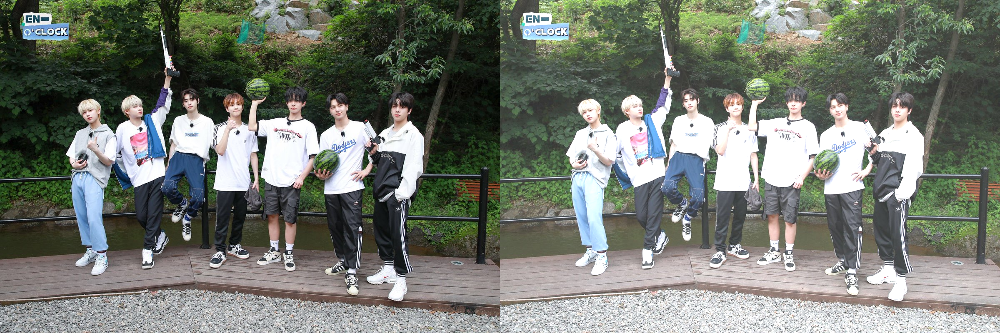

In [10]:
from zmq.constants import THREAD_PRIORITY
print(' Mengubah tingkat kecerahan citra ')
print(' -------------------------------- ')
try:
    brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
  print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/PCVK/ENHA.jpg')
brightness_image = np.zeros(original.shape, original.dtype)

#akses per pikse;
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):
            brightness_image[y,x,c] = np.clip(original[y,x,c] + brightness, 0, 255)
#cara simple tanpa for loop


final_frame = cv.hconcat((original, brightness_image))
cv2_imshow(final_frame)

**TUGAS**

1. Implementasikan inverse citra pada Google Colaboratory menggunakan formula yang
terdapat pada bagian Ulasan Teori, sehingga menghasilkan keluaran seperti berikut:


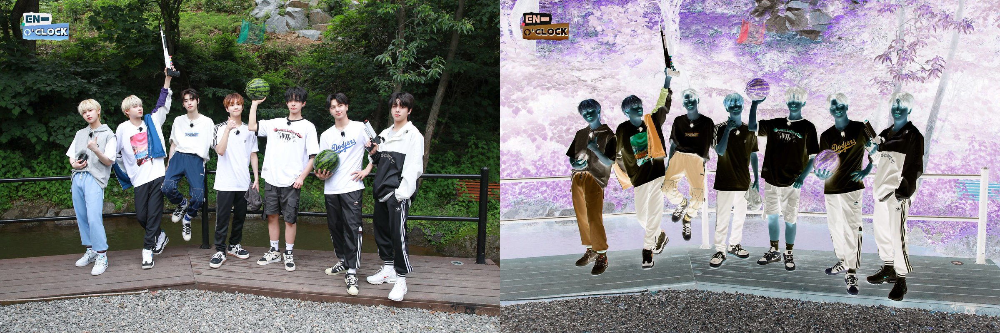

In [22]:
import cv2 as cv
import numpy as np

# Baca citra asli
original = cv.imread('/content/drive/MyDrive/PCVK/ENHA.jpg')

# Buat salinan citra asli
negative_image = np.copy(original)

# Mengubah setiap nilai piksel menjadi negatif
negative_image = 255 - negative_image

# Menampilkan citra asli dan citra negatif secara bersampingan
final_frame = cv.hconcat((original, negative_image))
cv2_imshow(final_frame)

# Tunggu hingga pengguna menekan tombol apa pun
cv.waitKey(0)
cv.destroyAllWindows()


2. Implementasikan transformasi contrast pada Google Colaboratory menggunakan
formula yang terdapat pada bagian Ulasan Teori untuk kontras, sehingga
menghasilkan keluaran seperti berikut:

 Mengubah kontras dan tingkat kecerahan citra 
 -------------------------------- 
Masukkan nilai kecerahan [-225 hingga 225]: 50
Masukkan nilai kontras [1.0 hingga 3.0]: 2.0


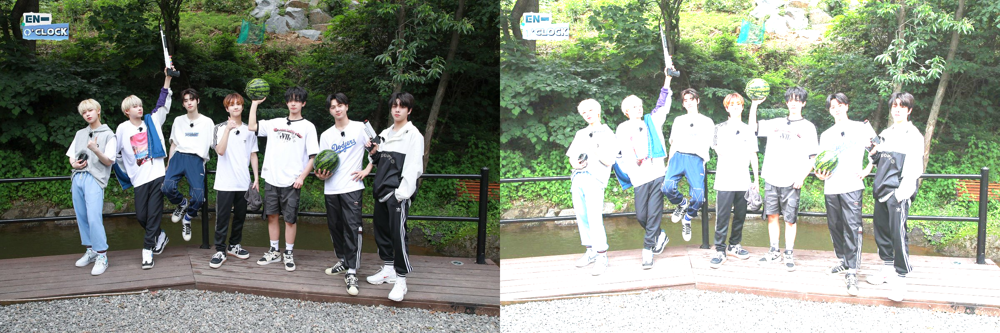

In [32]:
import cv2 as cv
import numpy as np

# Baca citra asli
original = cv.imread('/content/drive/MyDrive/PCVK/ENHA.jpg')
print(' Mengubah kontras dan tingkat kecerahan citra ')
print(' -------------------------------- ')
# Input nilai kecerahan dari pengguna
try:
    brightness = int(input('Masukkan nilai kecerahan [-225 hingga 225]: '))
    if brightness < -225 or brightness > 225:
        print('Error, nilai kecerahan harus dalam rentang -225 hingga 225')
        exit()
except ValueError:
    print('Error, bukan angka')
    exit()

# Input nilai kontras dari pengguna
try:
    contrast = float(input('Masukkan nilai kontras [1.0 hingga 3.0]: '))
    if contrast < 1.0 or contrast > 3.0:
        print('Error, nilai kontras harus dalam rentang 1.0 hingga 3.0')
        exit()
except ValueError:
    print('Error, bukan angka')
    exit()

# Mengubah tingkat kecerahan dan kontras citra
brightness_contrast_image = cv.convertScaleAbs(original, alpha=contrast, beta=brightness)

# Menampilkan citra asli dan citra yang telah diubah
final_frame = cv.hconcat((original, brightness_contrast_image))
cv2_imshow(final_frame)

# Tunggu hingga pengguna menekan tombol apa pun
cv.waitKey(0)
cv.destroyAllWindows()


3. Implementasikan transformasi logarithmic brightness pada Google Colaboratory
menggunakan formula yang terdapat pada bagian Ulasan Teori untuk transformasi
log, sehingga menghasilkan keluaran seperti berikut:


 Mengubah tingkat kecerahan citra dengan Transformasi log 
 -------------------------------- 
Masukkan nilai kecerahan: 50


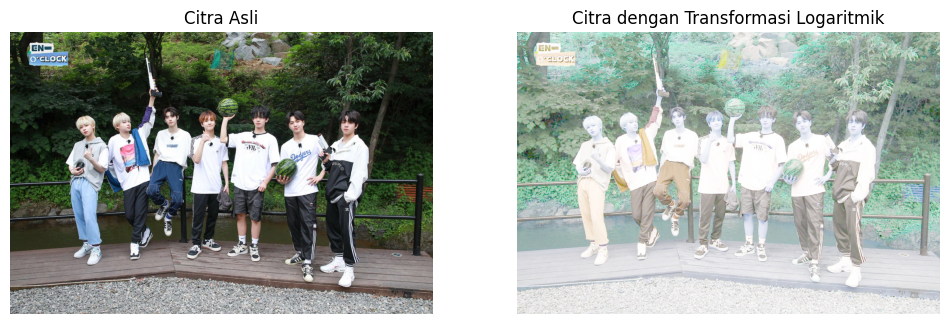

In [57]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Baca citra asli
original = cv.imread('/content/drive/MyDrive/PCVK/ENHA.jpg')
print(' Mengubah tingkat kecerahan citra dengan Transformasi log ')
print(' -------------------------------- ')
# Input nilai kecerahan dari pengguna
try:
    brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
    print('Error, not a number')
    exit()

# Lakukan transformasi logaritmik pada citra
c = 255 / np.log(1 + np.max(original))
log_transformed = c * (np.log(original.astype(np.float32) + 1))
log_transformed = np.uint8(np.round(log_transformed))

# Tambahkan tingkat kecerahan yang dimasukkan oleh pengguna
brightened_image = cv.add(log_transformed, brightness)

# Menampilkan citra asli dan citra dengan transformasi logaritmik tanpa skala
plt.figure(figsize=(12, 4))
plt.subplot(121)
plt.title('Citra Asli')
plt.imshow(cv.cvtColor(original, cv.COLOR_BGR2RGB))
plt.axis('off')  # Menghilangkan skala

plt.subplot(122)
plt.title('Citra dengan Transformasi Logaritmik')
plt.imshow(log_transformed, cmap='gray')
plt.axis('off')  # Menghilangkan skala

plt.show()


4. Implementasikan transformasi grayscale menggunakan metode averaging, lightness,
dan luminance pada Google Colaboratory menggunakan formula yang terdapat pada
bagian Ulasan Teori, sehingga menghasilkan keluaran seperti berikut:

A. Averaging

 Mengubah averaging citra 
 -------------------------------- 


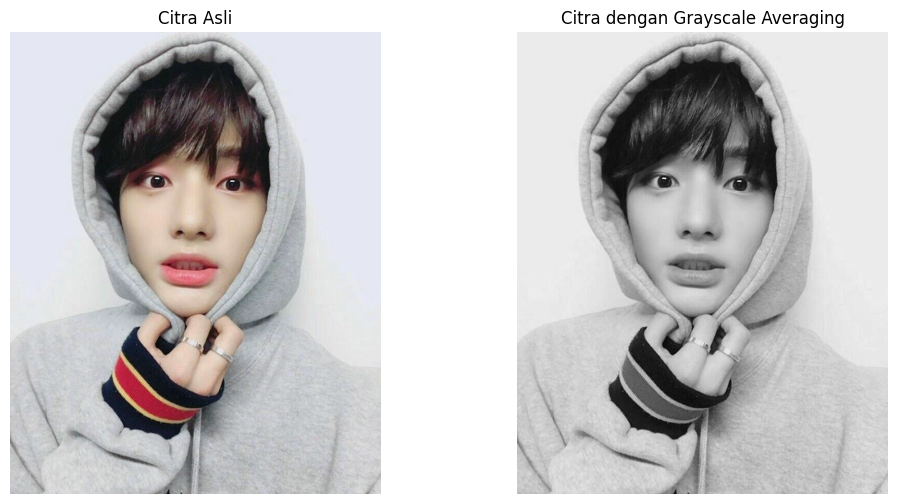

In [63]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Baca citra asli
original = cv.imread('/content/drive/MyDrive/PCVK/hyunjin.jpg')
print(' Mengubah averaging citra ')
print(' -------------------------------- ')

# Menghitung rata-rata nilai dari channel R, G, dan B
averaged_image = np.mean(original, axis=2).astype(np.uint8)

# Menampilkan citra asli dan citra dengan transformasi grayscale averaging
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.title('Citra Asli')
plt.imshow(cv.cvtColor(original, cv.COLOR_BGR2RGB))
plt.axis('off')  # Menghilangkan skala

plt.subplot(122)
plt.title('Citra dengan Grayscale Averaging')
plt.imshow(averaged_image, cmap='gray')
plt.axis('off')  # Menghilangkan skala
plt.show()


B. Linghtness

Transformasi Grayscale - Metode Lightness
---------------------------------


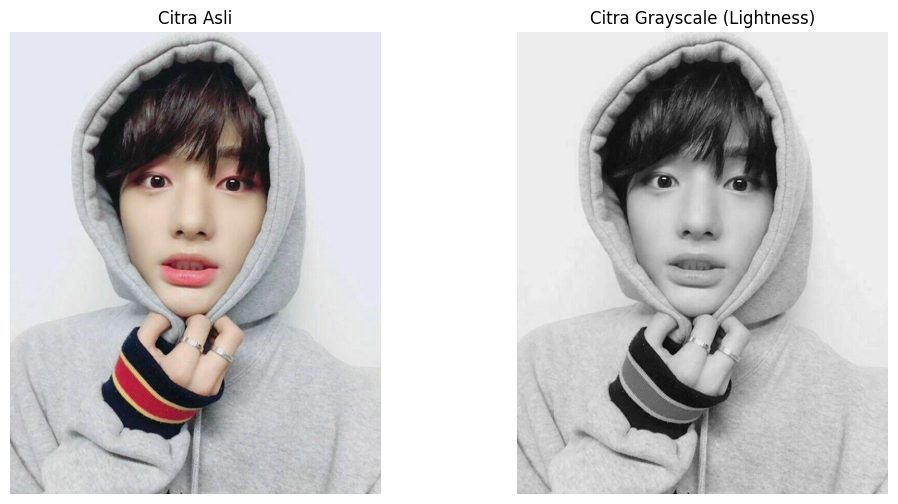

In [82]:
print('Transformasi Grayscale - Metode Lightness')
print('---------------------------------')

original = cv2.imread('/content/drive/MyDrive/PCVK/hyunjin.jpg')

grayscale_image = (np.max(original, axis=2))/2 + (np.min(original, axis=2)) / 2

# Menampilkan citra asli dan citra grayscale
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.title('Citra Asli')
plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
plt.axis('off')  # Menghilangkan skala

plt.subplot(122)
plt.title('Citra Grayscale (Lightness)')
plt.imshow(grayscale_image, cmap='gray')
plt.axis('off')
plt.show()

C. Luminance

 Mengubah citra menjadi Grayscale dengan metode Luminance 
 -------------------------------------------------------- 


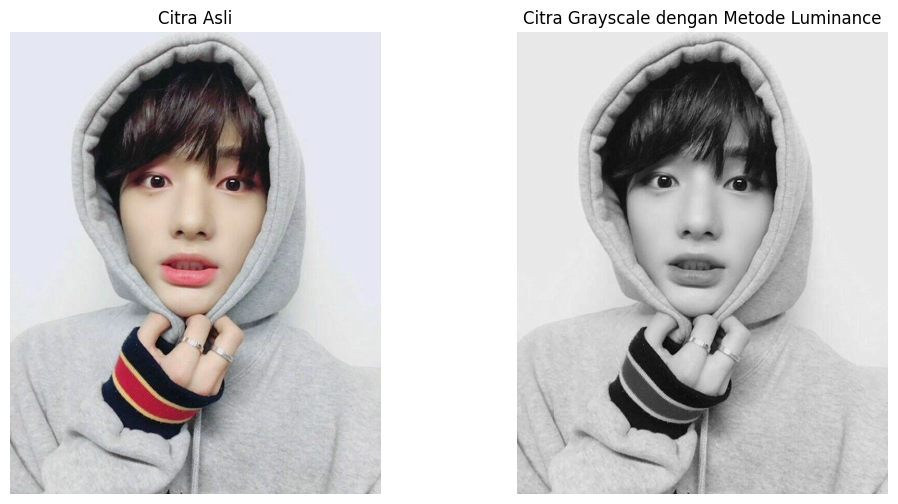

In [64]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Baca citra asli
original = cv.imread('/content/drive/MyDrive/PCVK/hyunjin.jpg')
print(' Mengubah citra menjadi Grayscale dengan metode Luminance ')
print(' -------------------------------------------------------- ')

# Menghitung nilai Luminance
luminance_image = (0.21 * original[:, :, 2] + 0.72 * original[:, :, 1] + 0.07 * original[:, :, 0]).astype(np.uint8)

# Menampilkan citra asli dan citra dengan transformasi Grayscale Luminance
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.title('Citra Asli')
plt.imshow(cv.cvtColor(original, cv.COLOR_BGR2RGB))
plt.axis('off')  # Menghilangkan skala

plt.subplot(122)
plt.title('Citra Grayscale dengan Metode Luminance')
plt.imshow(luminance_image, cmap='gray')
plt.axis('off')  # Menghilangkan skala

plt.show()


5. Tampilkanlah warna tertentu pada citra, dan ubah warna lain menjadi grayscale. Misal,
tampilkan warna biru pada citra masukan dan ubah bagian lain yang tidak berwarna
biru menjadi grayscale seperti pada contoh berikut:

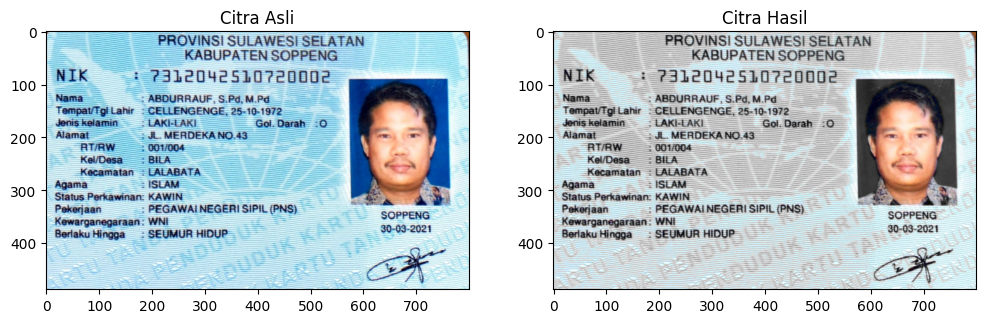

In [91]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Baca citra asli
original = cv2.imread('/content/drive/MyDrive/PCVK/ktp.jpg')

# Konversi citra ke dalam format warna HSV
hsv = cv2.cvtColor(original, cv2.COLOR_BGR2HSV)

# Tentukan range warna biru dalam format HSV
lower_blue = np.array([90, 50, 50])
upper_blue = np.array([130, 255, 255])

# Buat mask untuk warna biru
mask = cv2.inRange(hsv, lower_blue, upper_blue)

# Buat citra grayscale
grayscale_image = cv2.cvtColor(original, cv2.COLOR_BGR2GRAY)

# Ubah citra grayscale menjadi citra berwarna grayscale
colored_grayscale = cv2.cvtColor(grayscale_image, cv2.COLOR_GRAY2BGR)

# Setel bagian yang berwarna biru menjadi citra grayscale
output = np.copy(original)
output[mask != 0] = colored_grayscale[mask != 0]

# Menampilkan citra asli dan citra hasilnya berdampingan
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.title('Citra Asli')
plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))

plt.subplot(1, 2, 2)
plt.title('Citra Hasil')
plt.imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))

plt.show()


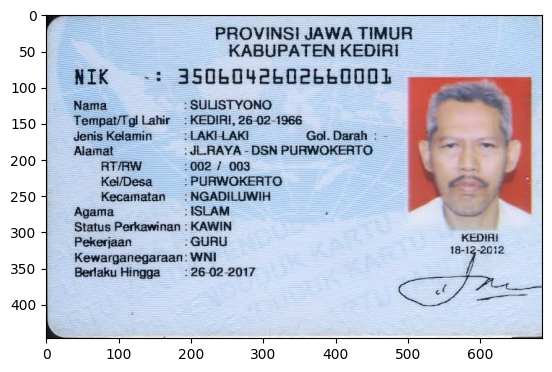

In [87]:
img = cv.imread('/content/drive/MyDrive/PCVK/ktp2.jpg')
img_rgb = cv.cvtColor(img,cv.COLOR_BGR2RGB)
plt.imshow(img_rgb)

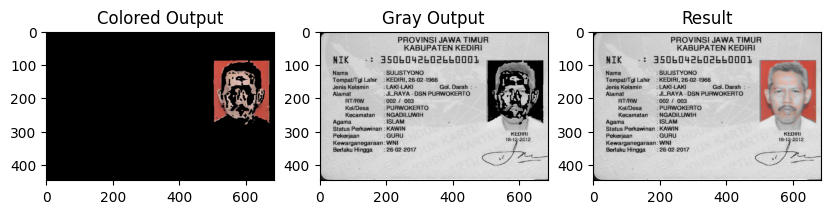

In [90]:
# Ubah gambar dari BGR ke RGB
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# Ubah gambar ke grayscale dan gabungkan channelnya
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
gray = cv.merge([gray, gray, gray])

# Ubah gambar ke ruang warna HSV
hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV)

# Tentukan batas untuk warna merah dalam ruang warna HSV
lower = np.array([0, 40, 80])
upper = np.array([10, 255, 255])



# Buat mask untuk warna merah
mask = cv.inRange(hsv, lower, upper)

# Ambil bagian merah dari gambar
colored_output = cv.bitwise_and(img, img, mask=mask)

# Ubah bagian non-merah menjadi grayscale
gray_output = cv.bitwise_and(gray, gray, mask=255-mask)

# Gabungkan bagian Merah
result = cv.add(colored_output, gray_output)

# Tampilkan gambar menggunakan matplotlib
plt.figure(figsize=(10, 10))

plt.subplot(1, 3, 1)
plt.imshow(cv.cvtColor(colored_output, cv.COLOR_BGR2RGB))
plt.title('Colored Output')

plt.subplot(1, 3, 2)
plt.imshow(cv.cvtColor(gray_output, cv.COLOR_BGR2RGB))
plt.title('Gray Output')

plt.subplot(1, 3, 3)
plt.imshow(cv.cvtColor(result, cv.COLOR_BGR2RGB))
plt.title('Result')

plt.show()


Menampilkan warna biru pada citra masukan dan mengubah bagian lain yang tidak berwarna biru menjadi grayscale
--------------------------------------------


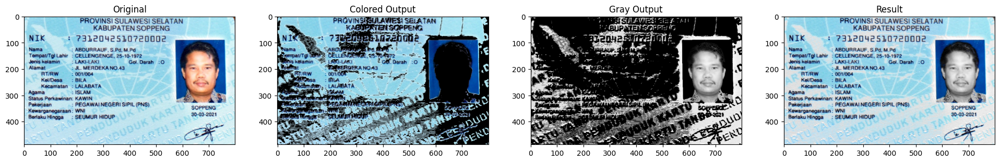

In [92]:
import cv2 as cv
from google.colab.patches import cv2_imshow
import numpy as np
import matplotlib.pyplot as plt


print('Menampilkan warna biru pada citra masukan dan mengubah bagian lain yang tidak berwarna biru menjadi grayscale')
print('--------------------------------------------')


original = cv.imread('/content/drive/MyDrive/PCVK/ktp.jpg')

# Ubah gambar dari BGR ke RGB
img_rgb = cv.cvtColor(original, cv.COLOR_BGR2RGB)

# Ubah gambar ke grayscale dan gabungkan channelnya
gray = cv.cvtColor(original, cv.COLOR_BGR2GRAY)
gray = cv.merge([gray, gray, gray])

# Ubah gambar ke ruang warna HSV
hsv = cv.cvtColor(original, cv.COLOR_BGR2HSV)

# Tentukan batas untuk warna biru dalam ruang warna HSV
lower = np.array([90, 50, 50])
upper = np.array([130, 255, 255])

# Buat mask untuk warna biru
mask = cv.inRange(hsv, lower, upper)

# Ambil bagian biru dari gambar
colored_output = cv.bitwise_and(original, original, mask=mask)

# Ubah bagian non-biru menjadi grayscale
gray_output = cv.bitwise_and(gray, gray, mask=255-mask)

# Gabungkan bagian biru
result = cv.add(colored_output, gray_output)

# Tampilkan gambar menggunakan matplotlib
plt.figure(figsize=(24, 16))

plt.subplot(1, 4, 1)
plt.imshow(cv.cvtColor(original, cv.COLOR_BGR2RGB))
plt.title('Original')

plt.subplot(1, 4, 2)
plt.imshow(cv.cvtColor(colored_output, cv.COLOR_BGR2RGB))
plt.title('Colored Output')

plt.subplot(1, 4, 3)
plt.imshow(cv.cvtColor(gray_output, cv.COLOR_BGR2RGB))
plt.title('Gray Output')

plt.subplot(1, 4, 4)
plt.imshow(cv.cvtColor(result, cv.COLOR_BGR2RGB))
plt.title('Result')

plt.show()